# Descriptive statistics of indexed data

This notebook is meant to illustrate how to:
* load data from the index
* calculate simple descriptive statistics based on the indexed data
* visulaize the data and some of the descriptive statistics

In [1]:
# Import libraries used below

from pymongo import MongoClient
from pymongo import collection
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

# Some magic to get plots shown in jupyter
%matplotlib inline

# Set seaborn styles
sns.set()
sns.set_style('whitegrid')

In [2]:
# Connect to the db

c = MongoClient()

In [3]:
# The availavble fields are shown

pd.DataFrame(list(c.big_hack.query.find())).columns

Index(['_id', 'accession', 'contig', 'covered_length', 'length',
       'meta__accession', 'meta__bio_project', 'meta__bio_sample',
       'meta__center', 'meta__common_name', 'meta__contig',
       'meta__display_name', 'meta__experiment', 'meta__experiment_title',
       'meta__insert_dev', 'meta__insert_size', 'meta__library_layout',
       'meta__library_selection', 'meta__library_source',
       'meta__library_strategy', 'meta__model', 'meta__platform',
       'meta__run_bases', 'meta__run_bytes', 'meta__run_spots', 'meta__sample',
       'meta__sample_name', 'meta__sample_type', 'meta__scientific_name',
       'meta__study_name', 'meta__study_title', 'meta__tax_id', 'perc50',
       'sample__accession', 'sample__bitscore', 'sample__btax',
       'sample__contig', 'sample__evalue', 'sample__hit_len', 'sample__pident',
       'sample__sacc', 'type'],
      dtype='object')

In [4]:
# Submit queries here
#
# Queries are submited as a dictionary,
#     with arguments requiring a logical operator being a nested dictionary of {operator:argument} structure
# Mongo db syntax is required for logical operators 
# For special operators see: https://docs.mongodb.com/manual/reference/operator/query/#query-selectors


result = pd.DataFrame(list(c.big_hack.query.find({"length":{"$gte":0}})))
result.drop(columns = ['_id','meta__accession','meta__contig','sample__accession','sample__contig'],inplace=True)
result = result[~(result.type == 'viral_ref')]
result.columns = [x.split('__')[1] if '__' in x else x for x in result.columns]
result['rs_identity'] = result['pident']*result['hit_len']/result['length']
result

,accession,contig,covered_length,length,bio_project,bio_sample,center,common_name,display_name,experiment,...,tax_id,perc50,bitscore,btax,evalue,hit_len,pident,sacc,type,rs_identity
0,ERR011128,Contig_68060_47.6107,562,562,PRJEB2054,SAMEA728658,BGI,None,None,ERX004087,...,408170,73,448.0,221029,1.950000e-124,290,94.483,NC_005841,denovo_contig,48.754573
1,ERR011268,Contig_13_203.952,2040,2040,PRJEB4336,SAMEA2154726,BGI,None,None,ERX294376,...,408170,321,62.1,546805,1.120000e-07,46,91.304,NC_011273,denovo_contig,2.058816
2,ERR011306,Contig_2859_44.9602,1451,1451,PRJEB2054,SAMEA728740,BGI,None,None,ERX004265,...,408170,84,87.9,1173769,1.300000e-15,47,100.000,NC_021774,denovo_contig,3.239145
3,ERR011265,Contig_896_23.1325,1160,1160,PRJEB4336,SAMEA2151468,BGI,None,None,ERX294373,...,408170,35,52.8,1391224,3.780000e-05,28,100.000,NC_024794,denovo_contig,2.413793
4,ERR031056,Contig_468_52.8776,306,306,PRJEB2062,SAMEA912954,SC,None,None,ERX1998297,...,77133,66,80.5,1458855,4.290000e-14,76,85.526,NC_024383,denovo_contig,21.241752
5,DRR014161,Contig_13545_35.8123,134631,134631,PRJDA72415,SAMD00002748,NIID,None,None,DRX012692,...,646099,42,65.8,1540099,5.780000e-07,45,93.333,NC_027297,denovo_contig,0.031196
6,DRR014161,Contig_12879_44.0672,40568,40568,PRJDA72415,SAMD00002748,NIID,None,None,DRX012692,...,646099,50,182.0,194949,1.660000e-42,235,80.851,NC_004914,denovo_contig,0.468349
7,DRR014178,Contig_14799_31.1835,123206,123206,PRJDA72415,SAMD00002763,NIID,None,None,DRX012709,...,646099,36,63.9,1813782,1.900000e-06,43,93.023,NC_031933,denovo_contig,0.032466
8,DRR014150,Contig_6937_45.8821,2989,2989,PRJDA72415,SAMD00002787,NIID,None,None,DRX012681,...,646099,50,95.3,1074307,1.620000e-17,79,88.608,NC_023714,denovo_contig,2.341931
9,DRR003618,Contig_5698_48.3152,867,867,PRJDA72415,SAMD00011142,NIID,None,None,DRX002929,...,646099,37,712.0,97081,0.000000e+00,526,91.825,NC_000902,denovo_contig,55.709285


In [5]:
# How many results were returned and how many unique values are there per field

print('# Contigs: '+str(result.index.size))
for feature in result.columns:
    print(str(feature)+': '+str(result[feature].unique().size))

# Contigs: 24150
accession: 3487
contig: 4785
covered_length: 5496
length: 5455
bio_project: 105
bio_sample: 1897
center: 72
common_name: 3
display_name: 1
experiment: 2020
experiment_title: 69
insert_dev: 6
insert_size: 130
library_layout: 2
library_selection: 7
library_source: 3
library_strategy: 3
model: 12
platform: 3
run_bases: 1973
run_bytes: 2020
run_spots: 1969
sample: 1899
sample_name: 1899
sample_type: 1
scientific_name: 53
study_name: 105
study_title: 104
tax_id: 53
perc50: 1351
bitscore: 941
btax: 747
evalue: 3262
hit_len: 1071
pident: 1888
sacc: 747
type: 2
rs_identity: 8304


In [6]:
# Are the fields normaly distributed (null hypothesis: The field is normaly distributed)

normality = pd.DataFrame()
for col in result.columns:
    if result[col].unique().size > 7:
        normality.at[col,'k2'], normality.at[col,'p'] = stats.normaltest(result[col].value_counts())
normality

/home/eldred.ribeiro/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1394: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  "anyway, n=%i" % int(n))


,k2,p
accession,2490.951612,0.000000e+00
contig,9707.846401,0.000000e+00
covered_length,9438.889207,0.000000e+00
length,9353.547916,0.000000e+00
bio_project,145.791914,2.196282e-32
bio_sample,2654.431304,0.000000e+00
center,143.579126,6.640320e-32
experiment,2957.750668,0.000000e+00
experiment_title,143.750931,6.093711e-32
insert_size,269.573618,2.902904e-59


[None]

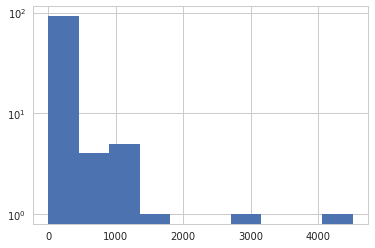

In [7]:
# Look at the distribution of the indicated field

field = 'bio_project'

result[field].value_counts().hist().set(yscale = 'log')

In [8]:
# For numerical fields, how are the values disctributed?
#
# Also, save the min and max values for later use

max_values = result.describe().loc['max']
min_values = result.describe().loc['min']
result.describe()

,covered_length,length,insert_size,run_bases,run_bytes,run_spots,perc50,bitscore,evalue,hit_len,pident,rs_identity
count,24150.000000,24150.000000,24150.000000,2.415000e+04,2.415000e+04,2.415000e+04,24150.000000,24150.000000,2.415000e+04,24150.000000,24150.000000,24150.000000
mean,16781.036977,16791.627412,321.060414,4.648818e+09,3.315293e+09,2.441091e+07,414.331180,905.533851,2.799842e-05,635.315031,93.571035,35.458170
std,36529.029126,36526.086634,105.425953,2.426978e+09,1.769717e+09,1.260339e+07,4306.504751,2826.572225,1.194860e-04,1838.673790,5.693702,96.328704
min,50.000000,50.000000,0.000000,1.240505e+06,5.036274e+06,3.596000e+03,31.000000,52.800000,0.000000e+00,28.000000,70.036000,0.008358
25%,681.000000,682.000000,319.000000,3.307295e+09,2.099256e+09,1.698491e+07,47.000000,65.800000,3.560000e-164,46.000000,90.804000,0.395212
50%,2946.000000,2962.000000,347.000000,4.691546e+09,3.241618e+09,2.516086e+07,80.000000,100.000000,1.390000e-18,77.000000,94.828000,4.628099
75%,14941.000000,14947.000000,350.000000,6.144495e+09,4.666481e+09,3.192987e+07,163.000000,580.000000,1.070000e-08,378.000000,97.867000,54.697215
max,406779.000000,406779.000000,3600.000000,1.588847e+10,6.985026e+09,7.865580e+07,242318.000000,89303.000000,1.000000e-03,48381.000000,100.000000,4543.156884


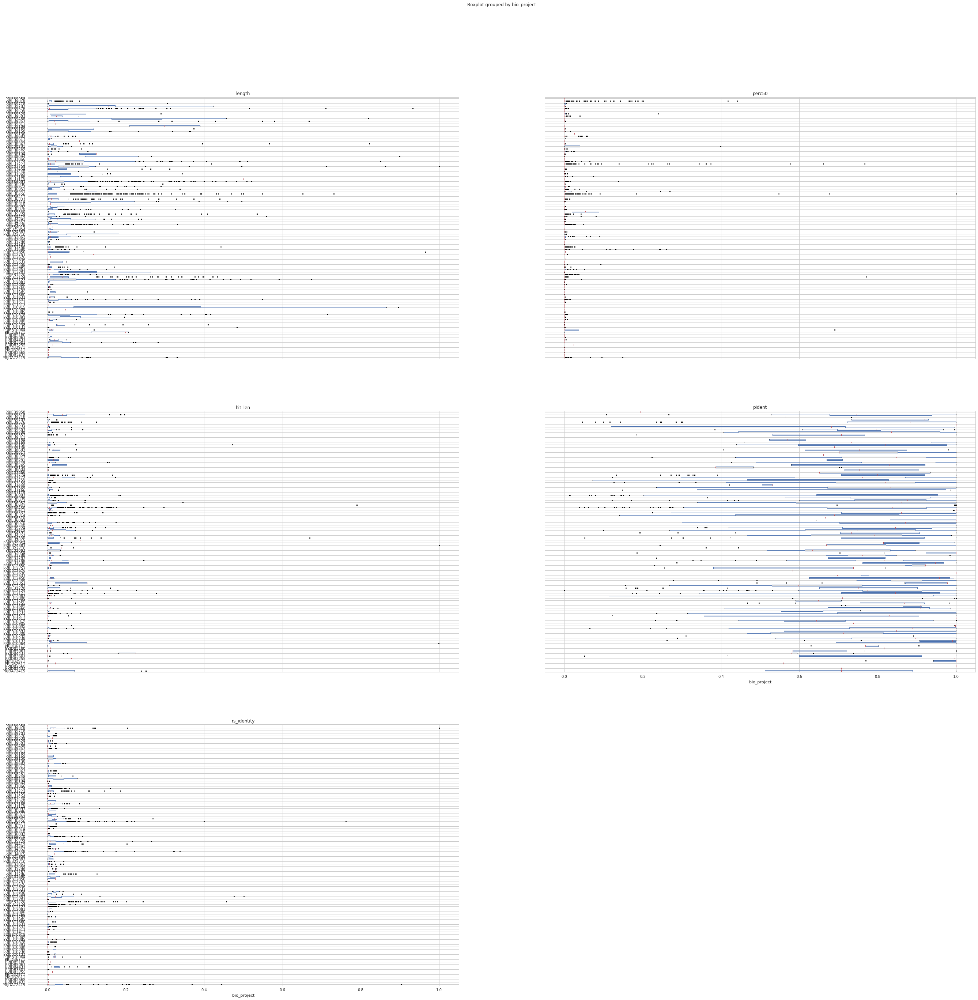

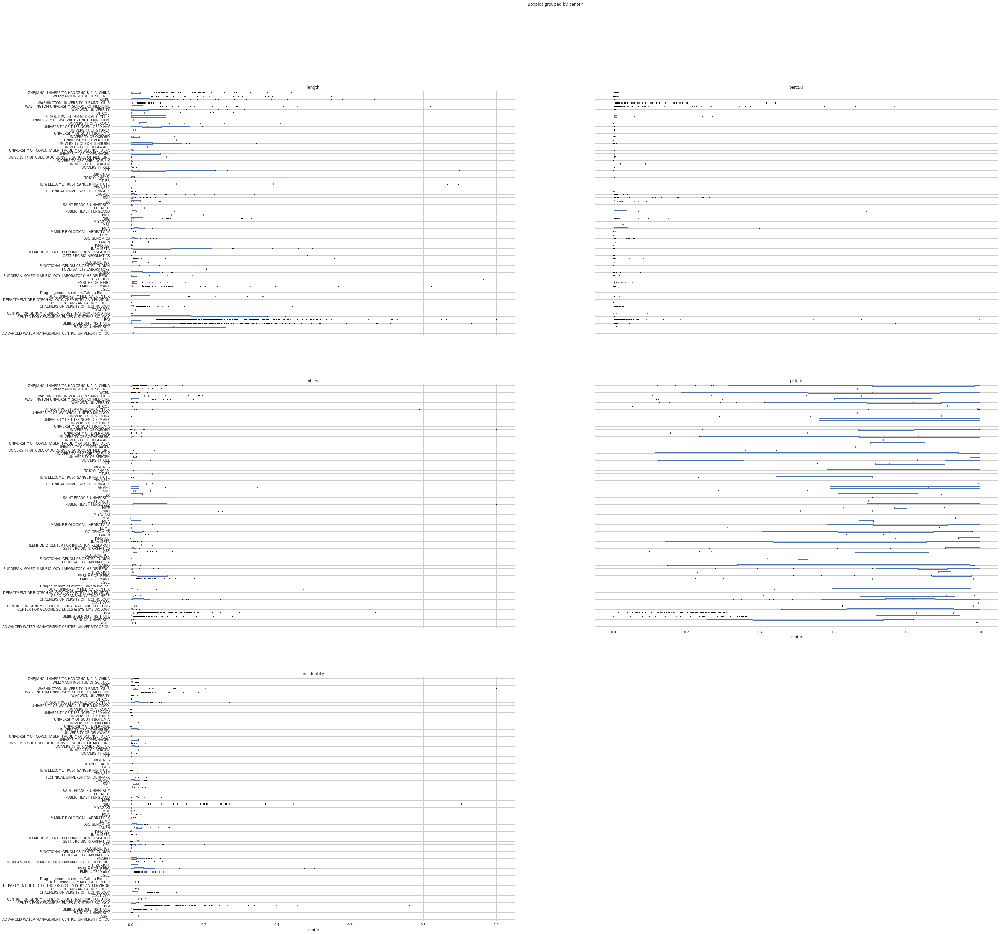

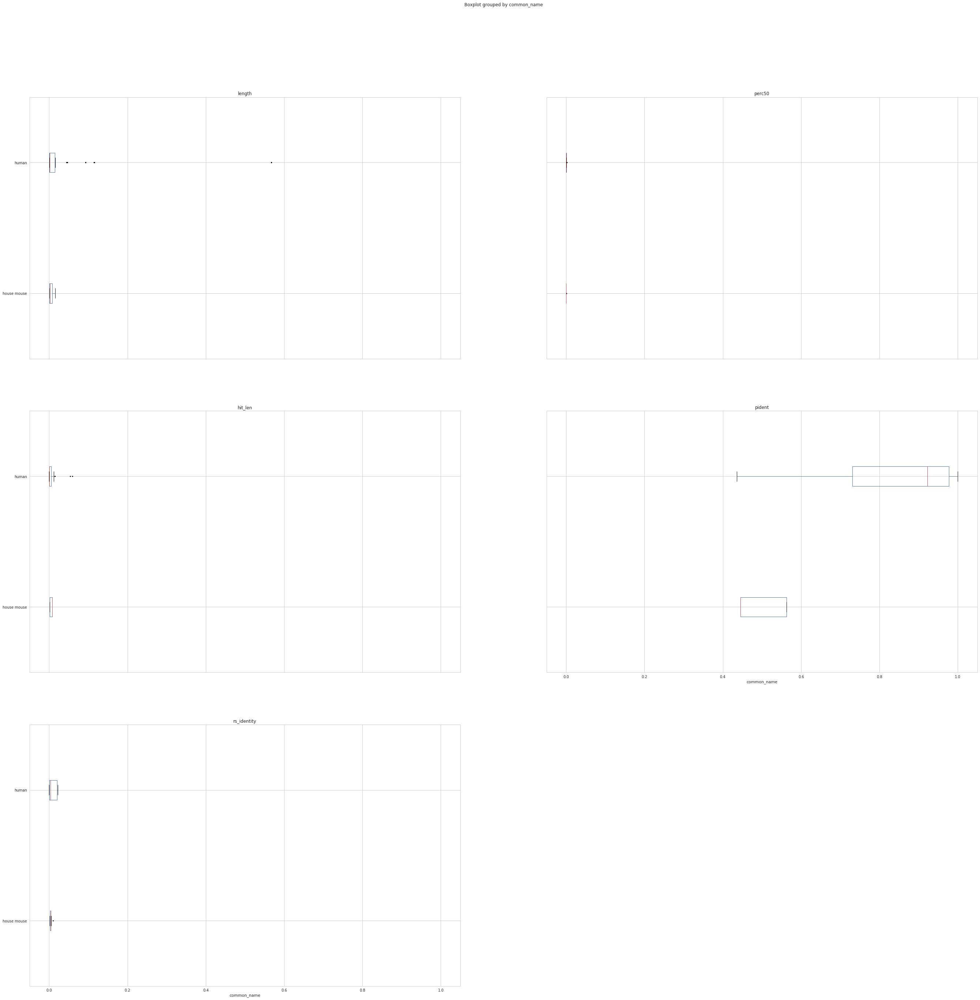

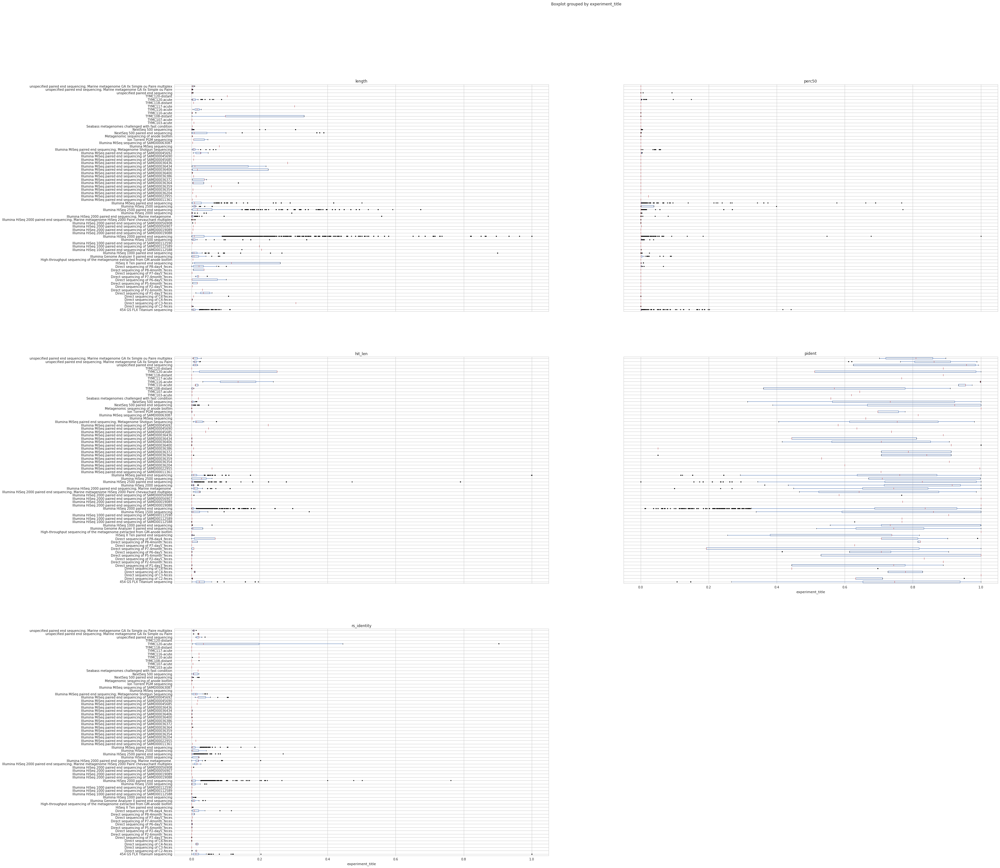

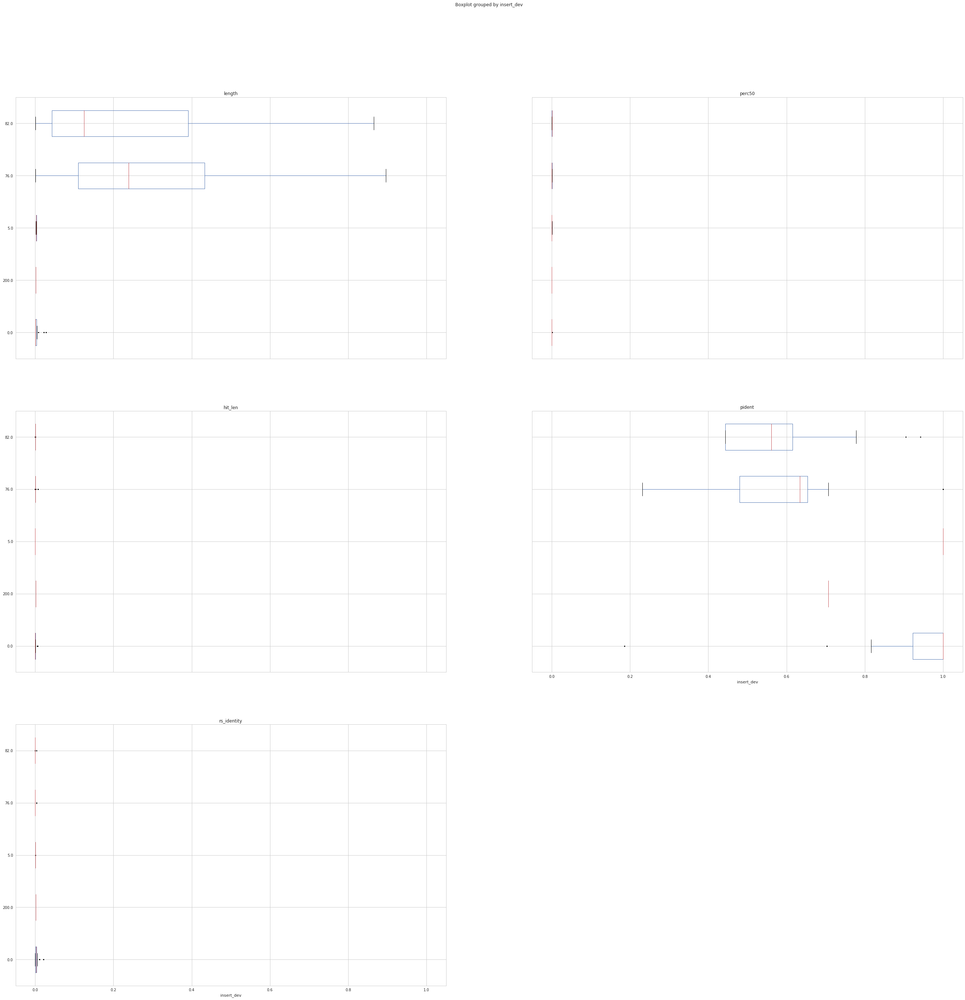

...

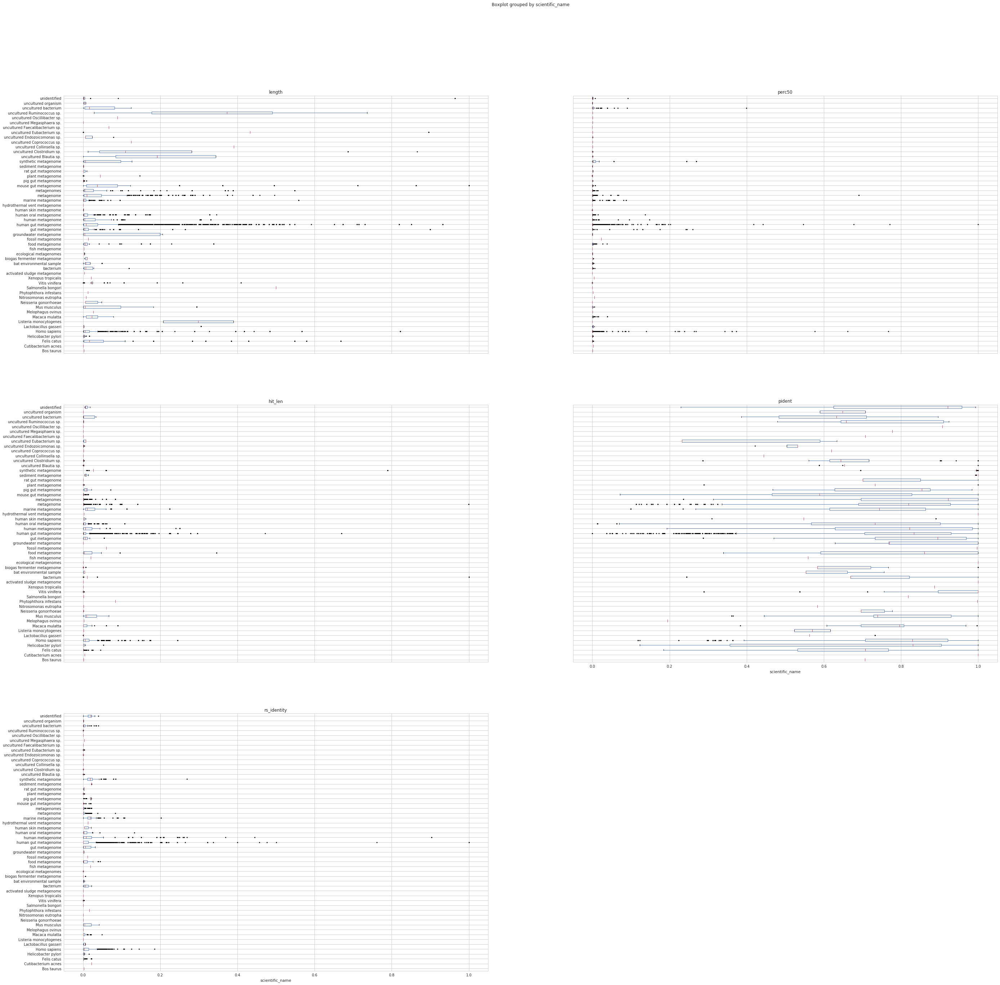

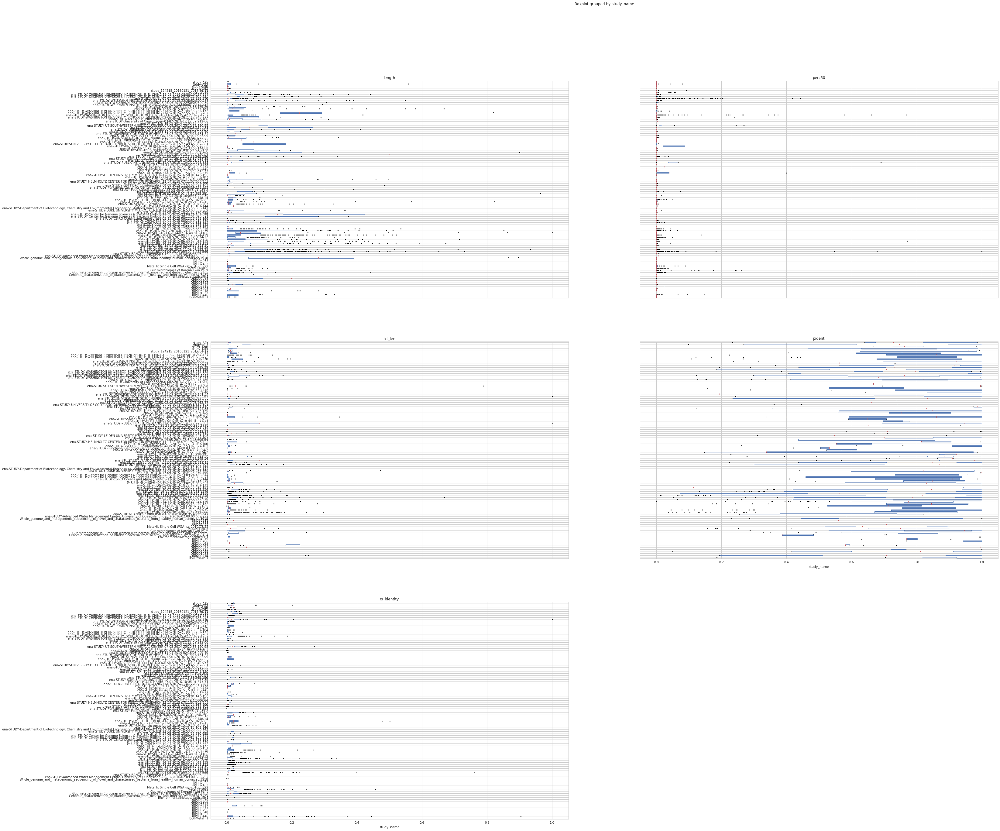

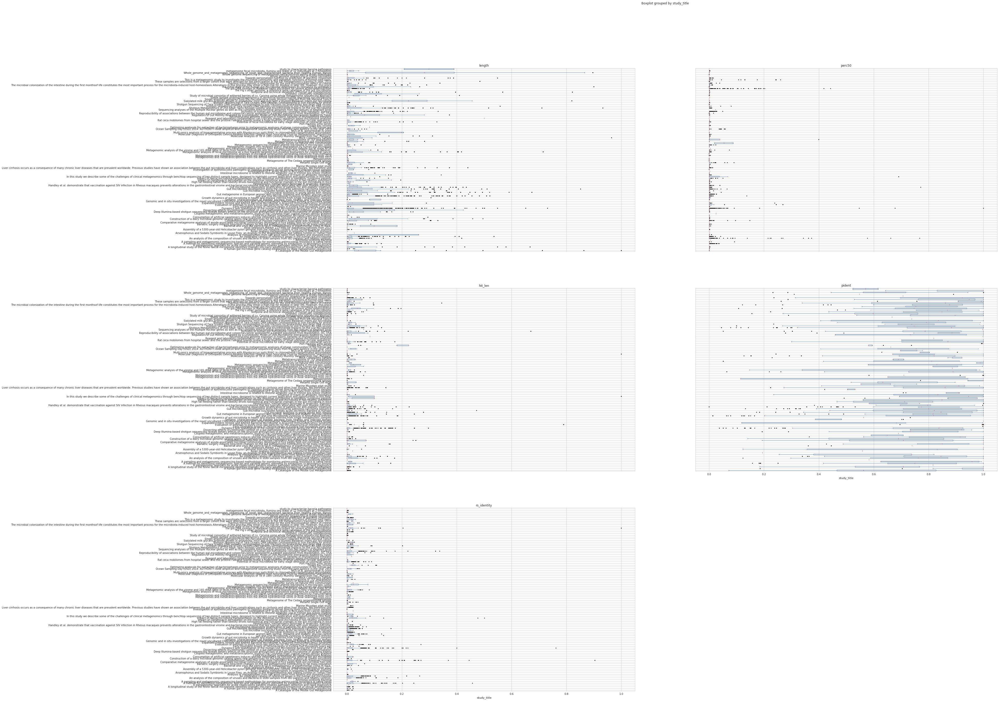

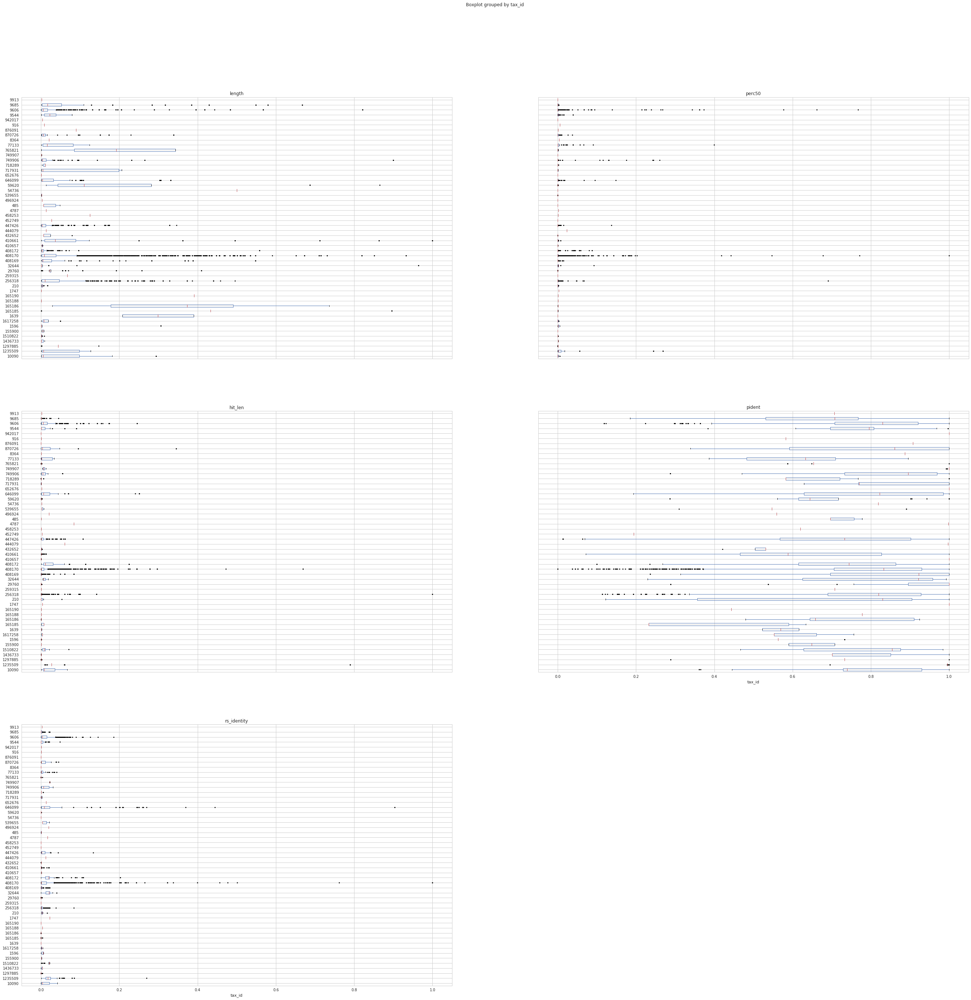

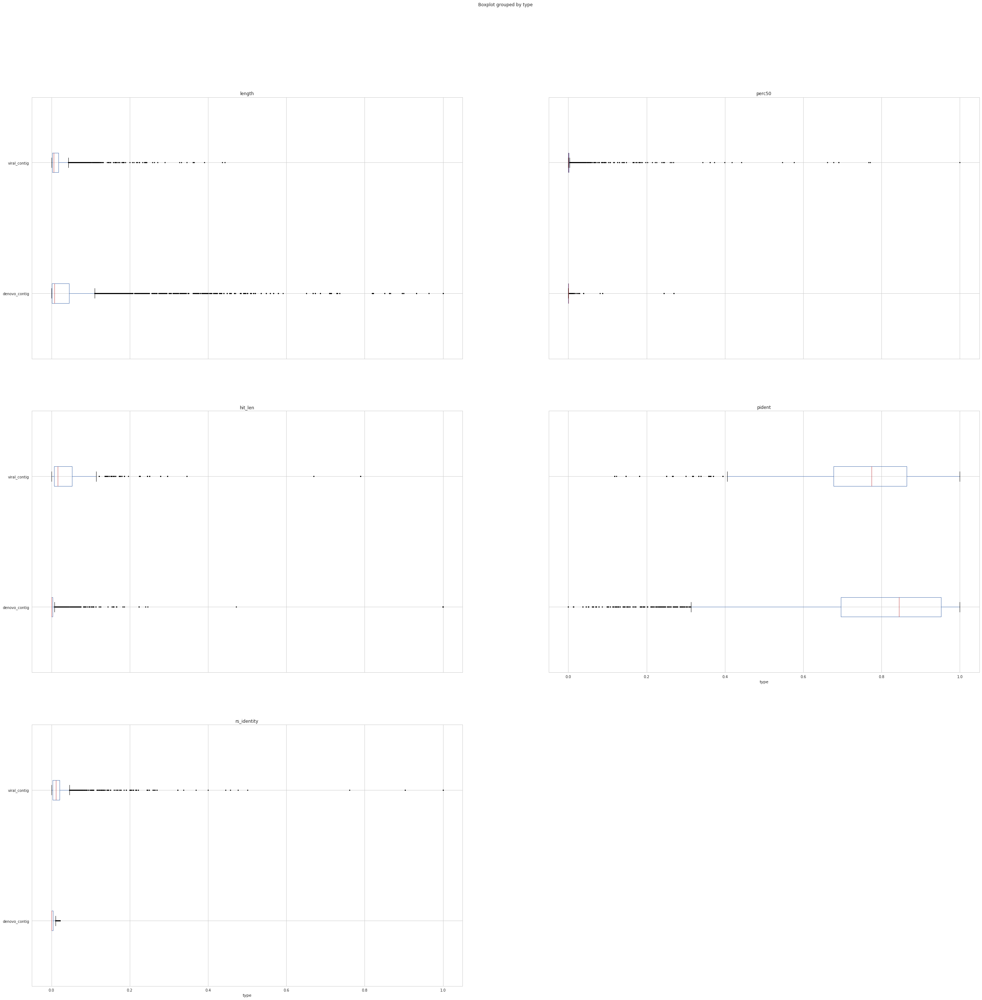

In [9]:
# Make sets of bar plots to show how contig length and average coverage, 
# as well as the hit length and percent identity for the best blastn hit vs RefSeq Virus
# are distributed as a function of the values in the various non-numerical fields

norm_result = result.copy(deep=True)
continuous = ['length', 'perc50', 'hit_len', 'pident','rs_identity']
discrete = list(x for x in result.columns if 1<result[x].unique().size<=150 not in (continuous))
for col in continuous:
    norm_result[col] = (norm_result[col]-min_values[col])/(max_values[col]-min_values[col])

for col in discrete:
    norm_result.boxplot(column = continuous, 
                        by = col, 
                        sym = 'k.',
                        vert = False, 
                        figsize = (45,45),
                       )

In [10]:
# Are the numerical fields correlated with eachother?

result.corr()

,covered_length,length,insert_size,run_bases,run_bytes,run_spots,perc50,bitscore,evalue,hit_len,pident,rs_identity
covered_length,1.000000,0.999987,0.041757,0.032662,0.050138,0.021950,-0.014129,-0.047142,0.037475,-0.053700,-0.085335,-0.152571
length,0.999987,1.000000,0.041763,0.032580,0.050037,0.021884,-0.014145,-0.046731,0.037411,-0.053264,-0.085379,-0.152523
insert_size,0.041757,0.041763,1.000000,0.298684,0.306295,0.234252,-0.035998,-0.050293,0.023396,-0.070100,0.008191,-0.080983
run_bases,0.032662,0.032580,0.298684,1.000000,0.947128,0.962157,-0.068807,-0.134318,0.151278,-0.148268,0.046157,-0.098033
run_bytes,0.050138,0.050037,0.306295,0.947128,1.000000,0.931058,-0.071729,-0.148299,0.152200,-0.163051,0.035880,-0.116898
run_spots,0.021950,0.021884,0.234252,0.962157,0.931058,1.000000,-0.069849,-0.119848,0.145559,-0.130360,0.044105,-0.080095
perc50,-0.014129,-0.014145,-0.035998,-0.068807,-0.071729,-0.069849,1.000000,0.078780,-0.017528,0.080742,-0.002306,0.025781
bitscore,-0.047142,-0.046731,-0.050293,-0.134318,-0.148299,-0.119848,0.078780,1.000000,-0.070664,0.976809,0.005098,0.294939
evalue,0.037475,0.037411,0.023396,0.151278,0.152200,0.145559,-0.017528,-0.070664,1.000000,-0.077293,0.243066,-0.085499
hit_len,-0.053700,-0.053264,-0.070100,-0.148268,-0.163051,-0.130360,0.080742,0.976809,-0.077293,1.000000,-0.064801,0.339656


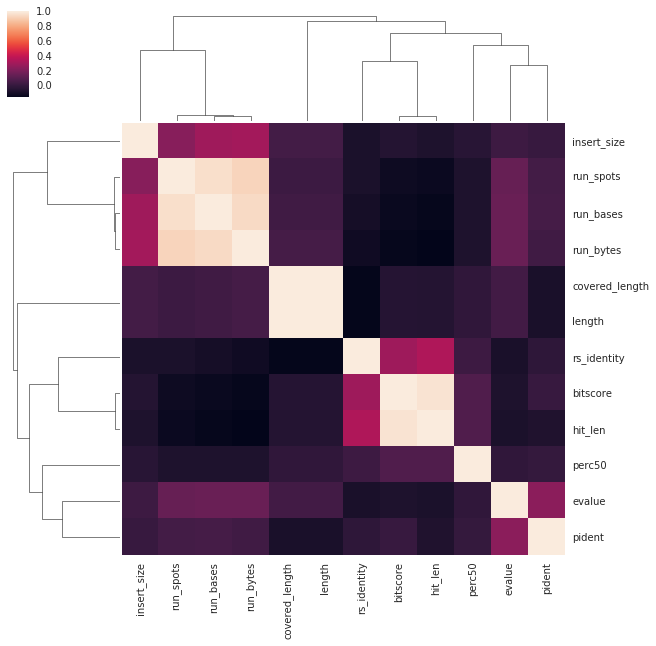

In [11]:
# Visualization of numerical field correlation

sns.clustermap(result.corr(),)

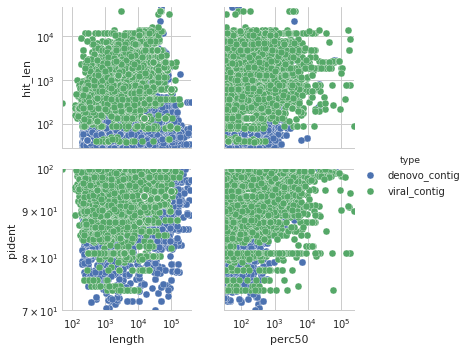

In [12]:
# Another way to visualize correlations between variables
# The hue argument allows coloring by some categorical feature

g = sns.pairplot(result,
                 x_vars = ['length','perc50'],
                 y_vars = ['hit_len','pident'],
                 hue='type')
for i in range(0, len(g.axes)):
        for j in range(0, len(g.axes[0])):
            g.axes[i,j].set(xscale='log', yscale='log',
                            xlim=(result[['length','perc50']].iloc[:,j].min(),
                                  result[['length','perc50']].iloc[:,j].max()), 
                            ylim=(result[['hit_len','pident']].iloc[:,i].min(),
                                  result[['hit_len','pident']].iloc[:,i].max()))

In [13]:
# correlation of selected numerical features as a function of a categorical feature

cat_feat = 'library_strategy'

result[['perc50','length','pident','hit_len','rs_identity',cat_feat]].groupby(cat_feat).corr(min_periods=5).dropna()

hit_len    length    perc50    pident  \
library_strategy                                                       
OTHER            hit_len      1.000000 -0.128044  0.236493 -0.165247   
                 length      -0.128044  1.000000 -0.046304 -0.309691   
                 perc50       0.236493 -0.046304  1.000000  0.048752   
                 pident      -0.165247 -0.309691  0.048752  1.000000   
                 rs_identity  0.734049 -0.279567  0.168994  0.052638   
WGA              hit_len      1.000000  0.095714  0.084448 -0.855147   
                 length       0.095714  1.000000  0.180487 -0.429369   
                 perc50       0.084448  0.180487  1.000000 -0.119850   
                 pident      -0.855147 -0.429369 -0.119850  1.000000   
                 rs_identity  0.298060 -0.488084 -0.076072  0.116853   
WGS              hit_len      1.000000 -0.054026  0.080527 -0.062609   
                 length      -0.054026  1.000000 -0.014264 -0.083424   
                 perc50       0.080527 -0.014264  1.000000 -0.002024   
                 pident      -0.062609 -0.083424 -0.002024  1.000000   
                 rs_identity  0.339360 -0.152036  0.025491 -0.021264   

                              rs_identity  
library_strategy                           
OTHER            hit_len         0.734049  
                 length         -0.279567  
                 perc50          0.168994  
                 pident          0.052638  
                 rs_identity     1.000000  
WGA              hit_len         0.298060  
                 length         -0.488084  
                 perc50         -0.076072  
                 pident          0.116853  
                 rs_identity     1.000000  
WGS              hit_len         0.339360  
                 length         -0.152036  
                 perc50          0.025491  
                 pident         -0.021264  
                 rs_identity     1.000000

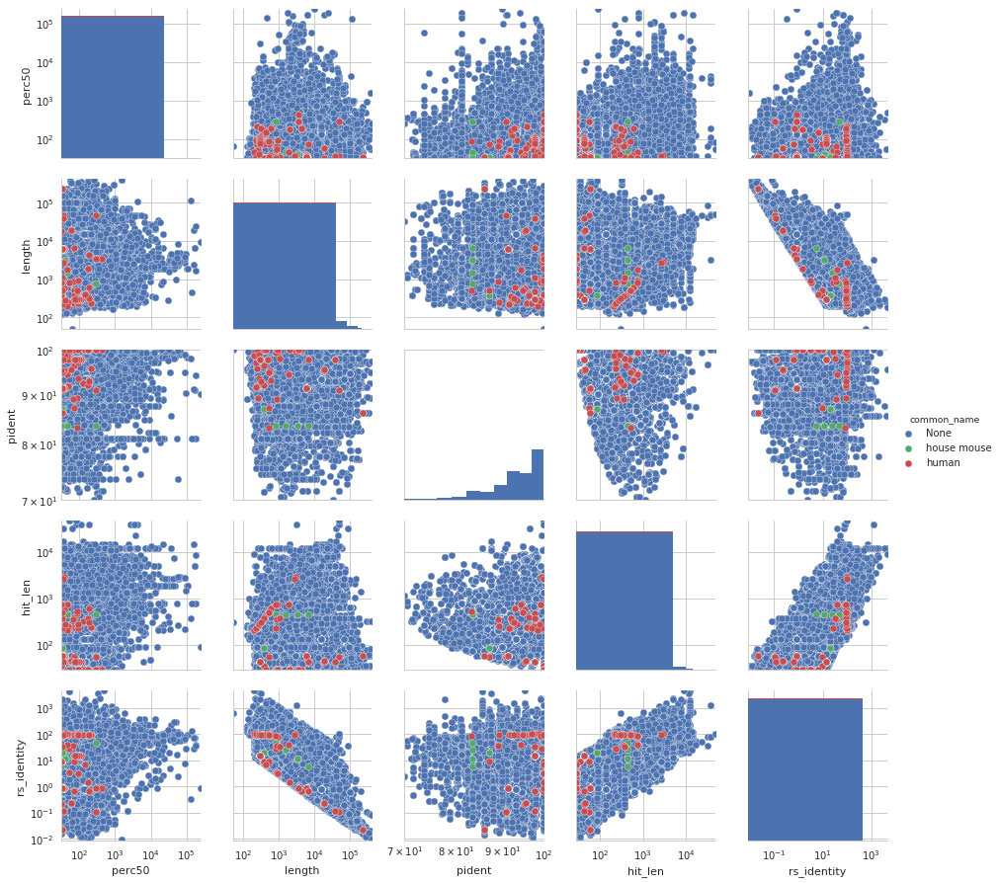

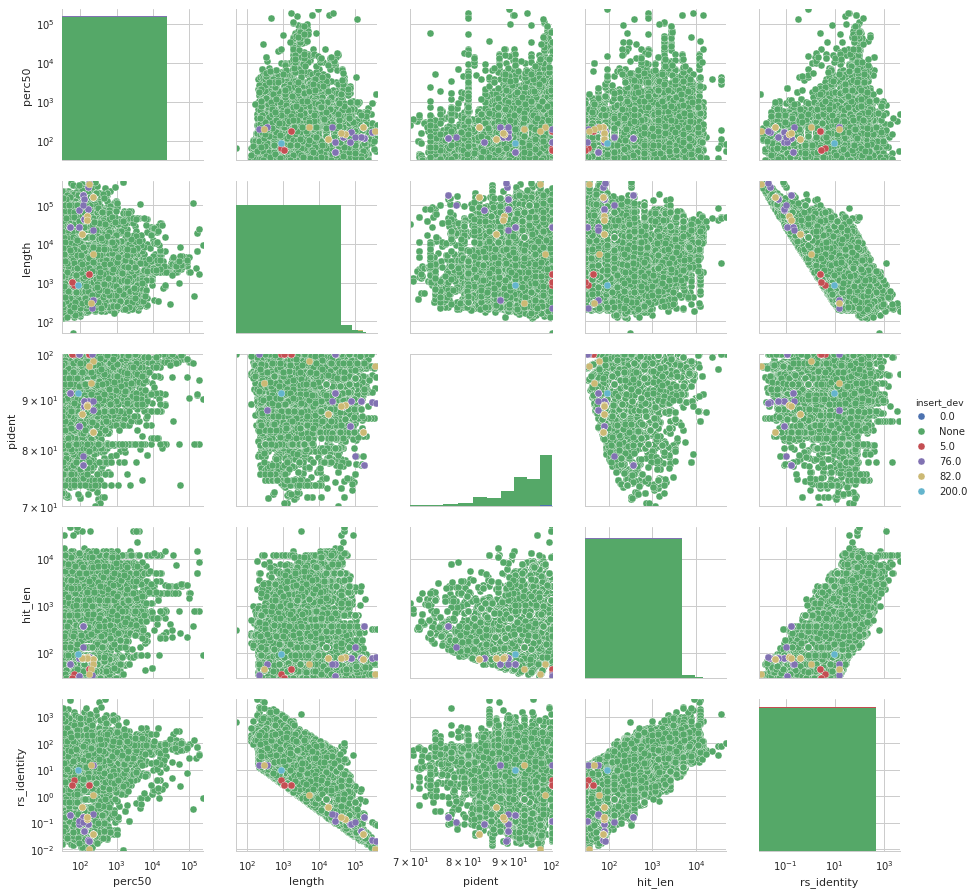

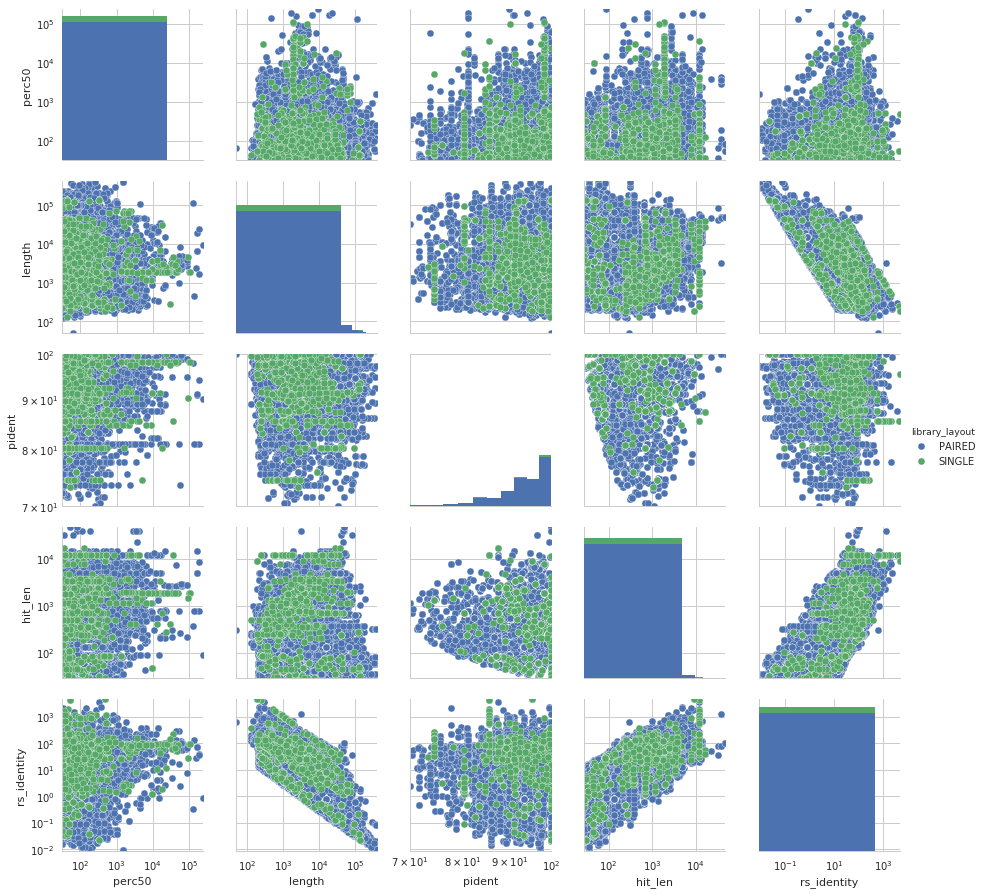

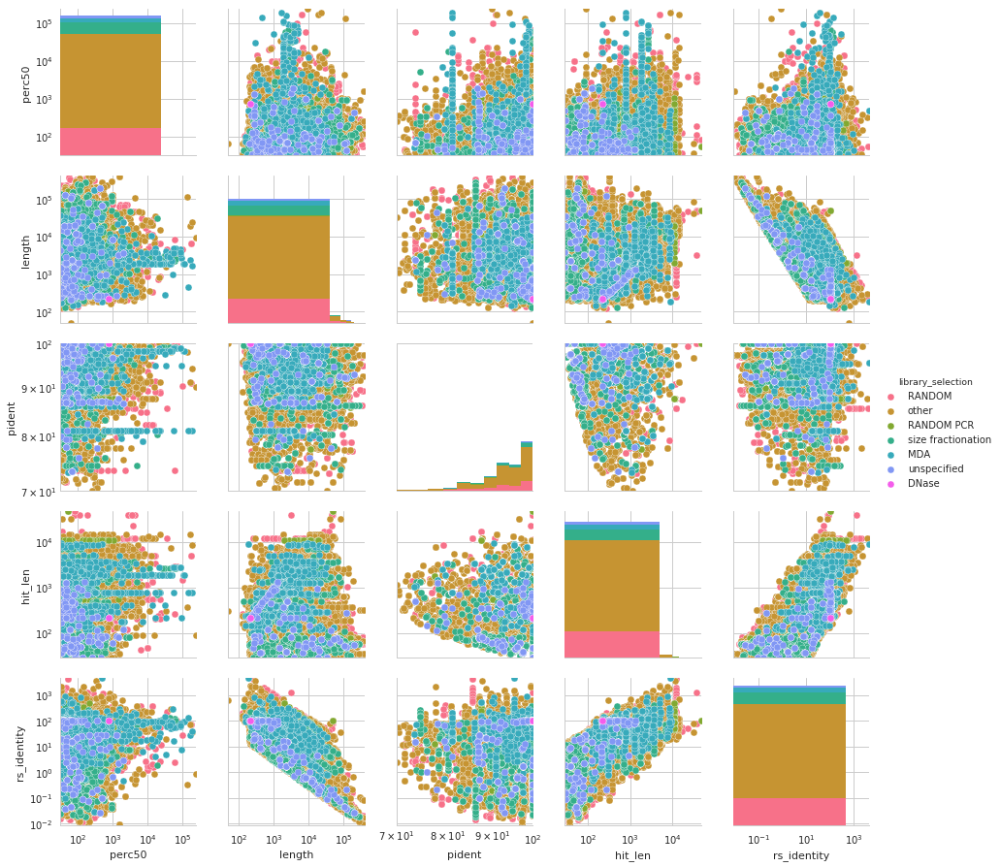

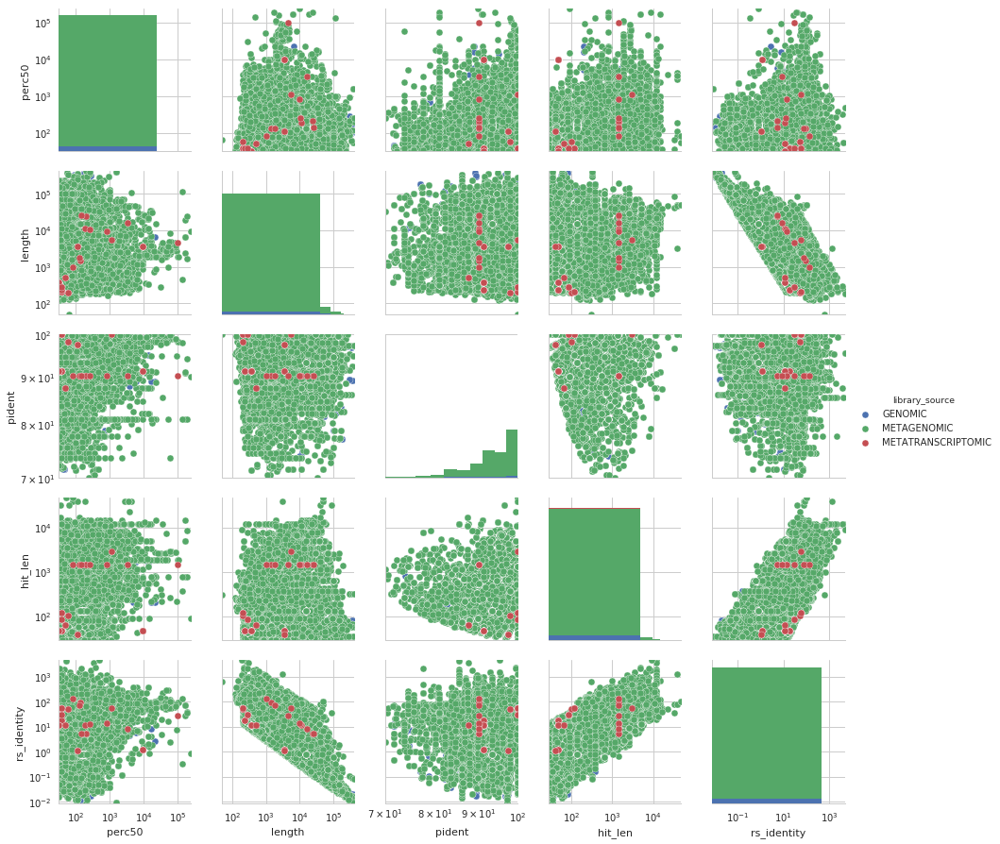

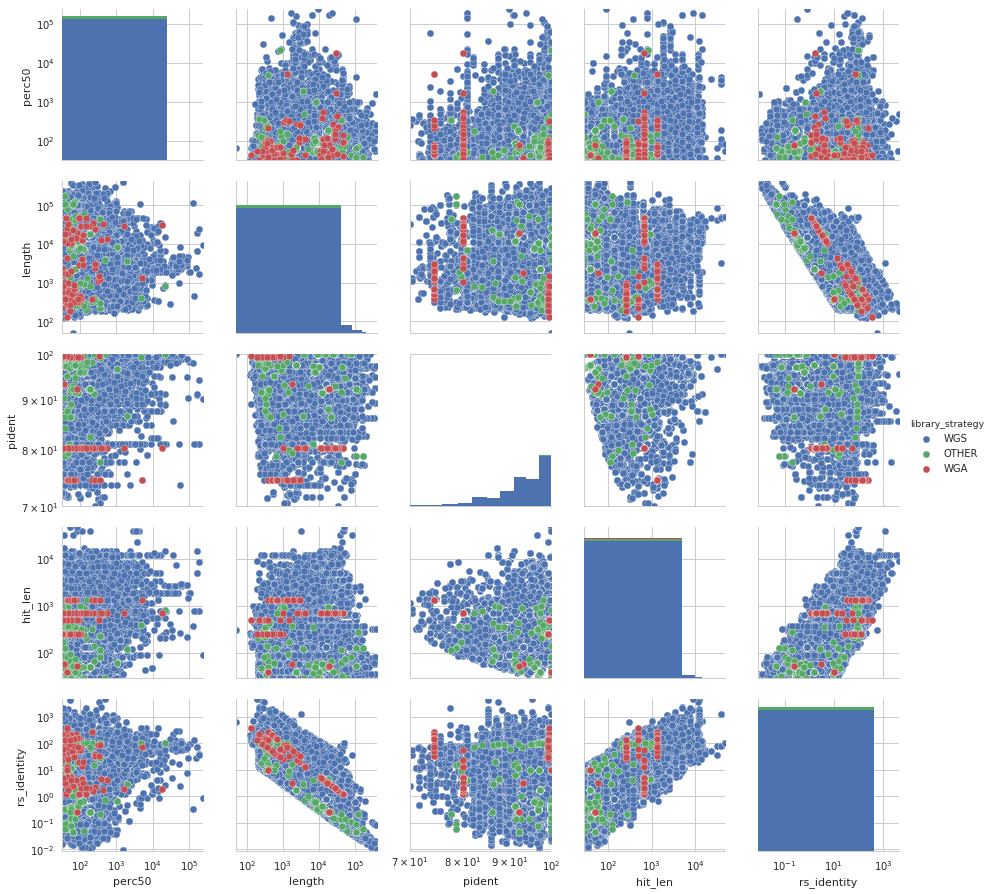

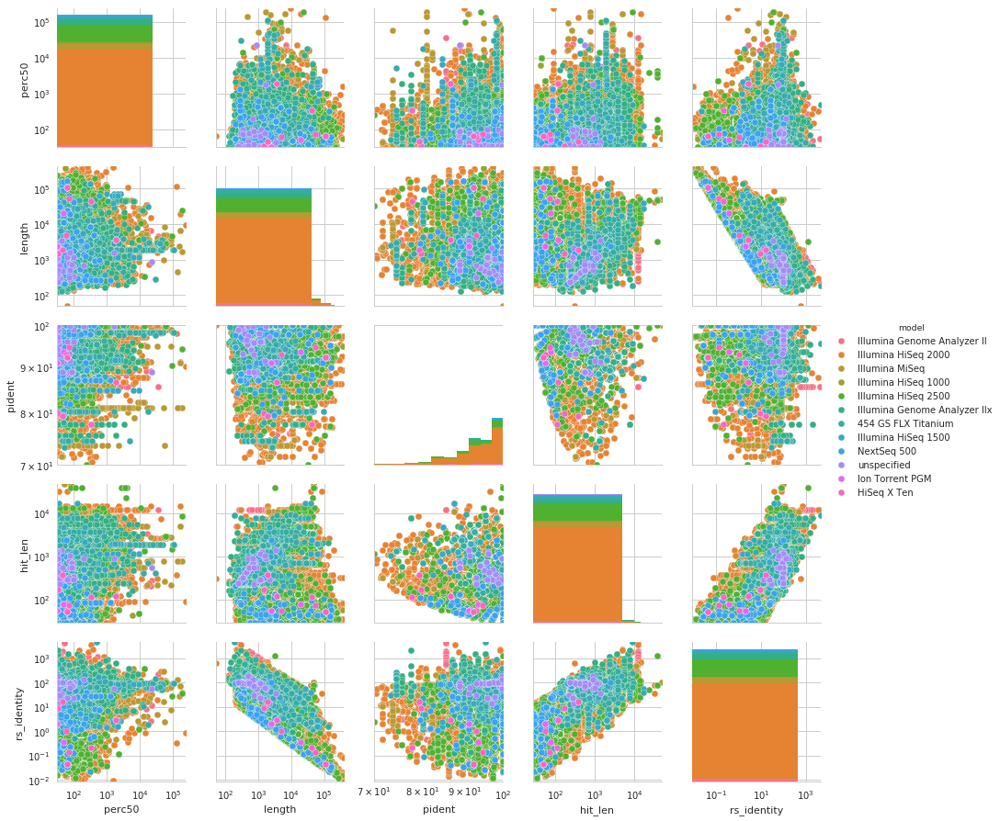

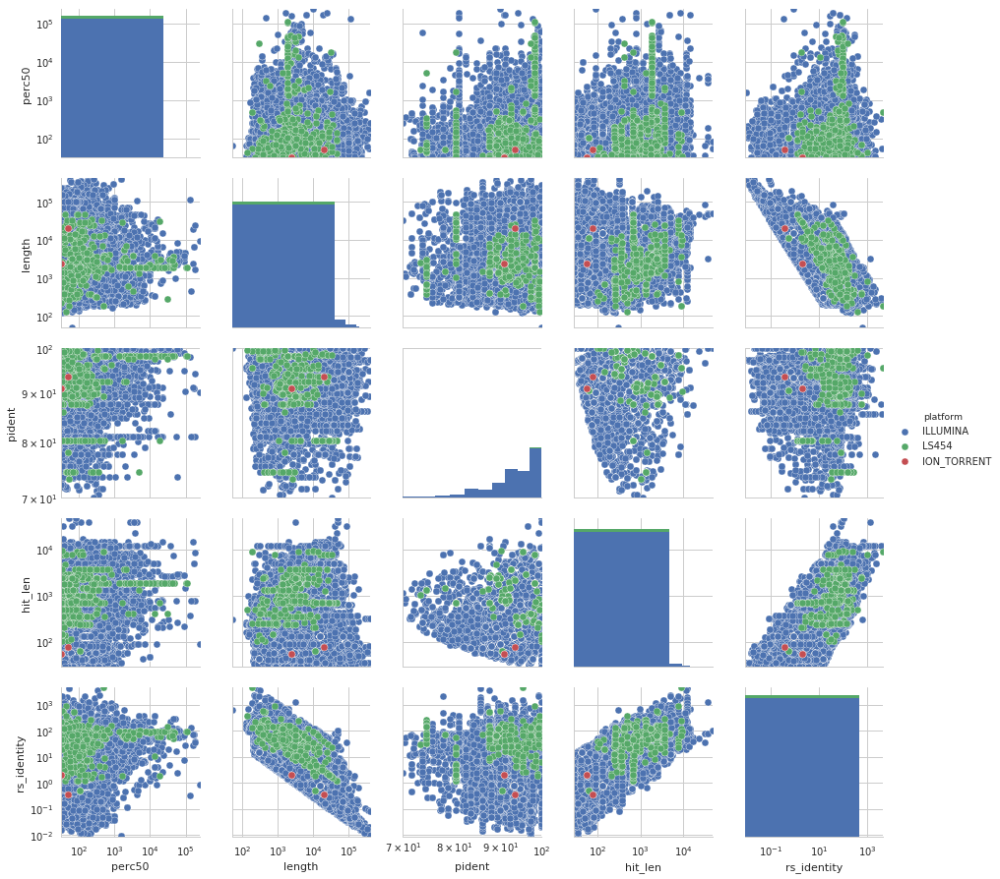

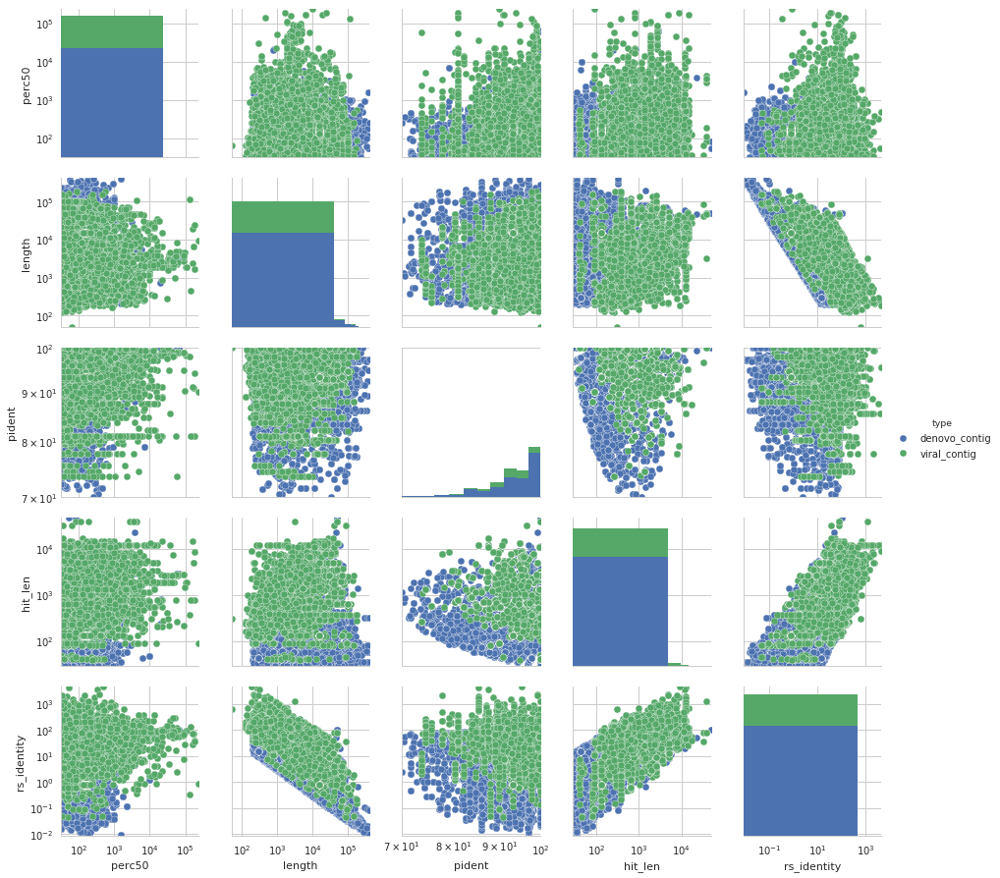

In [14]:
# Visualize the above style of analysis

discrete = list(x for x in result.columns if 1<result[x].unique().size<=15 not in (continuous))
for col in discrete:
    g = sns.pairplot(result[['perc50','length','pident','hit_len','rs_identity',col]].astype({col:'str'}),hue=col)
    for i in range(0, len(g.axes)):
        for j in range(0, len(g.axes[0])):
            g.axes[i,j].set(xscale='log', yscale='log',
                            xlim=(result[['perc50','length','pident','hit_len','rs_identity',col]].iloc[:,j].min(),
                                  result[['perc50','length','pident','hit_len','rs_identity',col]].iloc[:,j].max()), 
                            ylim=(result[['perc50','length','pident','hit_len','rs_identity',col]].iloc[:,i].min(),
                                  result[['perc50','length','pident','hit_len','rs_identity',col]].iloc[:,i].max()))

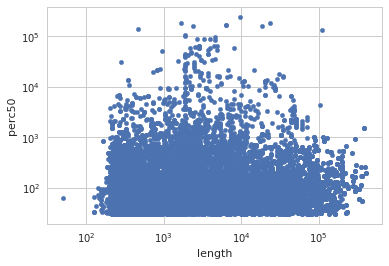

In [15]:
# Plot of contig length vs. average coverage

result.plot.scatter('length','perc50',logx=True,logy=True)

In [16]:
# Make interactive plot of contig length vs. average coverage
# Points are color codded by contig identiy to best refseq hit by blastn
#     where identity = pident*hit_len/length
# on hover contig index in the result dataframe, SRR Id, and Contig ID are shown

import plotly.graph_objs as go
import plotly
from numpy import log10

plotly.offline.init_notebook_mode(connected=True)

trace1 = go.Scatter(
    x = result['length'].values,
    y = result['perc50'].values,
    mode='markers',
    marker=dict(
        size=4,
        color = [log10(x) for x in result['rs_identity']],
        showscale=True,
        colorbar = dict(
            title='log %Ident.<br>RefSeq'
        ),
        colorscale='Jet'
    ),
    text = [x for x in map('<br>'.join, zip(result['accession'].values, result['contig'].values))]
)
data = [trace1]
layout = go.Layout(
    xaxis=dict(
        title='Contig Length (bp)',
        type='log',
        autorange=True
    ),
    yaxis=dict(
        title='Average Coverage',
        type='log',
        autorange=True
    ),
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig, filename='Species_Neighbor_vs_RS_Length')